#Project Stage 2, Data Pre Processing#

useful links from professor:

https://www.nature.com/articles/s41699-020-0137-z

https://paperswithcode.com/task/semantic-segmentation

In [ ]:
import numpy as np
from random import randint
from collections import Counter
import re
import glob
from google.colab import drive
drive.mount("/content/drive")

data_dir = '/content/drive/My Drive/Cracks in thin section'

Mounted at /content/drive


In [ ]:
%pylab inline 

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['randint']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


##Load/Format Data from Drive##


In [ ]:
all_orig_imgs = glob.glob(f'{data_dir}/*.tif')
all_orig_imgs.sort()
all_class_imgs = glob.glob(f'{data_dir}/*.png')
all_class_imgs.sort()

###Split Train/Test Data##

In [ ]:
import cv2
#set random indexes aside for test data
def get_test_indexes(max, num):
  indexes = []
  for i in range(num):
    index = randint(0, max)
    while index in indexes:
      index = randint(0, max)
    indexes.append(index)
  return indexes

#custom test train split function
def test_train_split(orig, clas):
  indexes = get_test_indexes(len(all_orig_imgs), 2)
  test_data = []
  train_data = []
  for i, img in enumerate(orig):
    if i in indexes:
      train_data.append([orig[i], clas[i]])
    else:
      # print(i)
      test_data.append([orig[i], clas[i]])
  return (np.array(test_data), np.array(train_data))

#classified images in rgb
#   this funciton converts to grayscale, then splits to binary classes (0 & 1)
def convert_to_bin(img,threshold=127.5,invert=False):
  grayImage = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  (thresh, blackAndWhiteImage) = cv2.threshold(grayImage, 127, 255, cv2.THRESH_BINARY)
  grayImage = None
  if not invert:
    return blackAndWhiteImage/255
  else:
    return np.absolute((blackAndWhiteImage/255) - np.ones(blackAndWhiteImage.shape))

In [ ]:
(train_data, test_data) = test_train_split(all_orig_imgs, all_class_imgs)
print(f'training size: {len(train_data)}')
print(f'testing  size: {len(test_data)}')


training size: 6
testing  size: 2


##Show Corresponding Images##

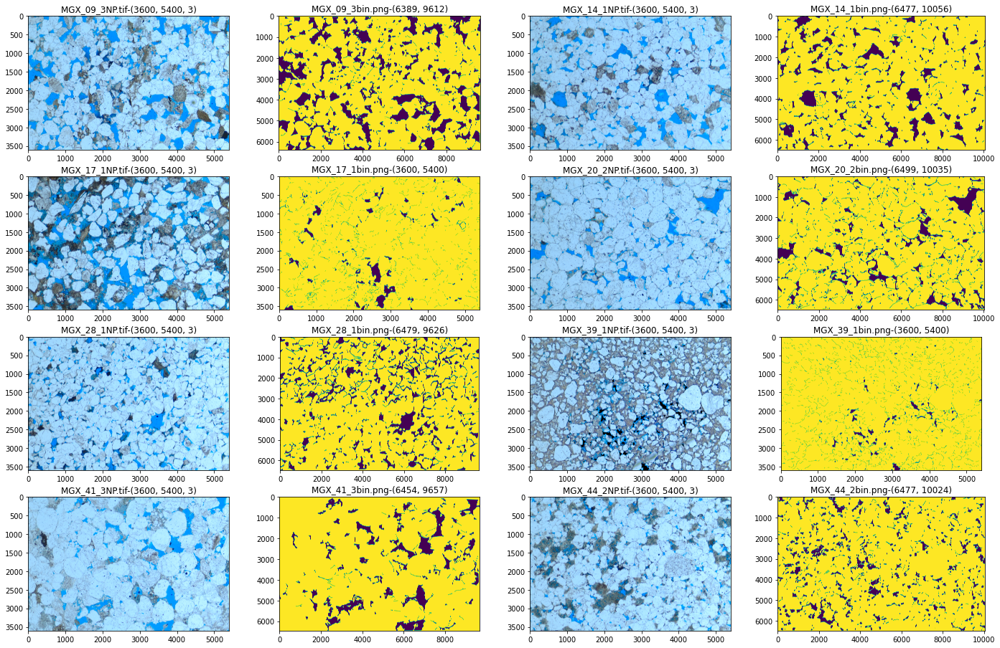

In [ ]:
fig = figure(0, (24,24))
num_cols = 4
num_rows = int(ceil(len(test_data)*2/num_cols)) + 2
cur_img = -1

for i, imgs in enumerate(test_data):
  cur_img += 2
  # print(imgs)
  im1 = imread(imgs[0], 0)
  im2 = convert_to_bin(imread(imgs[1], 0))
  fname1 = str(imgs[0]).split('/')[-1]
  fname2 = str(imgs[1]).split('/')[-1]
  fig.add_subplot(num_rows, num_cols, cur_img); title(f'{fname1}-{im1.shape}')
  imshow(im1)
  fig.add_subplot(num_rows, num_cols, cur_img+1); title(f'{fname2}-{im2.shape}')
  imshow(im2)
im1 = None
im2 = None

#Initial Manipulations and Discovery

##Show distributions of color values

First row is red, green, and blue value histograms for the first image

Second row is the classification values (only 1s and 0s showing void space)

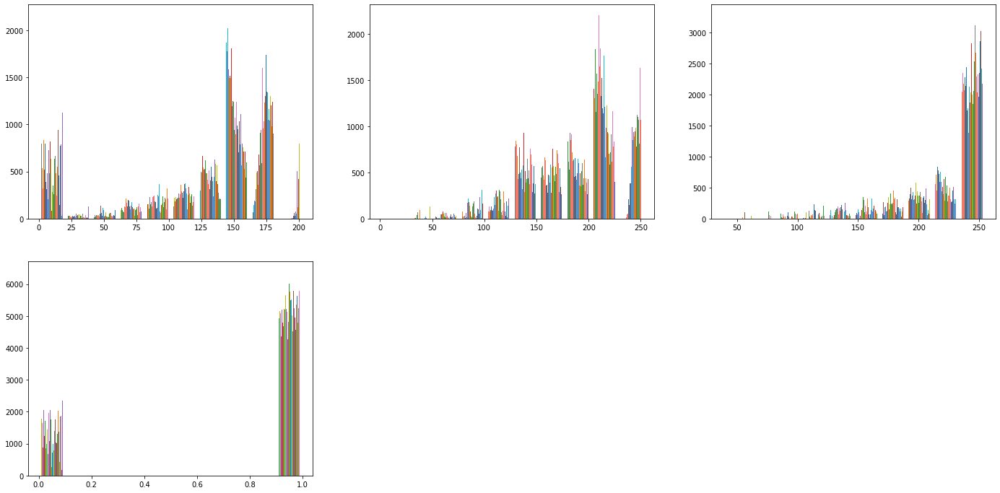

In [ ]:
fig = figure(0, (24,12))

imgs = test_data[0]
orig = imread(imgs[0])
clas = convert_to_bin(plt.imread(imgs[1],0))

orig_r = orig[:,:,0]
orig_g = orig[:,:,1]
orig_b = orig[:,:,2]

fig.add_subplot(2,3,1)
plt.hist(orig_r)
fig.add_subplot(2,3,2)
plt.hist(orig_g)
fig.add_subplot(2,3,3)
plt.hist(orig_b)

fig.add_subplot(2,3,4)
plt.hist(clas)
print()#prevent hist data from displaying

Show quantity of different values

NOTE: first approach will go after independed rgb values; if this doesnt work well, we will expand upon dependet rgb values

In [ ]:
#these values are for a single original/classified image pair
print(f'bin:  {Counter(clas.ravel())}')#number of 1s and 0s for classified image

h = np.dstack((orig_r,orig_g,orig_b))
origRGB = []
for i in range(h.shape[0]):
  origRGB.append(f'{h[i,0]},{h[i,1]},{h[i,2]}')
h = None
print(f'{len(Counter(origRGB).keys())} different rgb values out of {len(origRGB)}\n')#number of the same rgb values

print(f'red:  {len(Counter(orig_r.ravel()).keys())} different values')#number of the same red values
print(f'grn:  {len(Counter(orig_g.ravel()).keys())} different values')#number of the same green values
print(f'blu:  {len(Counter(orig_b.ravel()).keys())} different values')#number of the sameblue values

bin:  Counter({1.0: 57174726, 0.0: 7957986})
3599 different rgb values out of 3600

red:  179 different values
grn:  222 different values
blu:  200 different values


##Mean Standard & Deviation Approach
###Independent rgb

The idea is to get the rgb values of known void space then find their means and standard deviations



If a given rgb pixel measure fits within a chosen range, it must be void space as well

In [ ]:
from scipy.stats import norm
from statistics import stdev

class VoidFinderManualInd(object):
    def __init__(self):
      pass

    def highlightVoidSpace(self, input, output,plot=False):
      fig = figure(0, (48,100))
      num_cols = 3
      num_rows = int(ceil(len(input)*3/num_cols)) + 3
      cur_img = -2
      voidImgs = []
      for i in range(len(input)):
        cur_img += 3
        orig = plt.imread(input[i],0)
        clas = convert_to_bin(cv2.resize(plt.imread(output[i],0),(orig.shape[1],orig.shape[0])),invert=True)
        voidR = np.multiply(orig[:,:,0],clas).astype(int)
        voidG = np.multiply(orig[:,:,1],clas).astype(int)
        voidB = np.multiply(orig[:,:,2],clas).astype(int)
        void = np.dstack((voidR,voidG,voidB))
        voidImgs.append(void)
        if plot:
          fig.add_subplot(num_rows, num_cols, cur_img); title(orig.shape)
          imshow(orig)
          fig.add_subplot(num_rows, num_cols, cur_img+1); title(clas.shape)
          imshow(clas)
          fig.add_subplot(num_rows, num_cols, cur_img+2); title(void.shape)
          imshow(void)
      orig = None
      clas = None
      void = None
      return np.array(voidImgs)

    def findVoidValues(self, voidR, voidG, voidB):
      self.stdevR = stdev(voidR)
      self.meanR = mean(voidR)
      self.stdevG = stdev(voidG)
      self.meanG = mean(voidG)
      self.stdevB = stdev(voidB)
      self.meanB = mean(voidB)
      print('Format\t[mean,stdev]')
      print(f'R\t{[self.meanR,self.stdevR]}\nG\t{[self.meanG,self.stdevG]}\nB\t{[self.meanB,self.stdevB]}')
      return ([self.meanR,self.stdevR], [self.meanG,self.stdevG], [self.meanB,self.stdevB])

    def rejectOutliers(data, m=2):
      data = np.array(data)
      return data[abs(data - np.mean(data)) < m * np.std(data)]

    def withinRange(self,val,color='A',amt=1):
      stdev = None
      mean = None
      if color == 'R':
        stdev = self.stdevR
        mean = self.meanR
      elif color == 'G':
        stdev = self.stdevG
        mean = self.meanG
      elif color == 'B':
        stdev = self.stdevB
        mean = self.meanB
      else:
        stdev = mean([self.stdevR,self.stdevG,stdevB])
        mean = mean([self.meanR,self.meanG,self.meanB])
      return val <= mean + amt*stdev and val >= mean - amt*stdev

    def isVoidSpace(self, x, sigAmt=1):
      xR = x[0]
      xG = x[1]
      xB = x[2]
      return self.withinRange(xR,'R',sigAmt) and self.withinRange(xG,'G',sigAmt) and self.withinRange(xB,'B',sigAmt)

    def predictImg(self,input,sigAmt=1,invert=False):
      shp = input.shape

      out_rvl = []

      for i in range(shp[0]):
        for j in range(shp[1]):
          if self.isVoidSpace(input[i,j,:],sigAmt):
            out_rvl.append(1)
          else:
            out_rvl.append(0)
      
      out_im = np.reshape(np.array(out_rvl),(shp[0],shp[1]))
      if invert:
        out_im = np.absolute(out_im - np.ones(out_im.shape))
      return out_im
      

In [ ]:
vf = VoidFinderManualInd()

####Output to show visualization of isolating void space

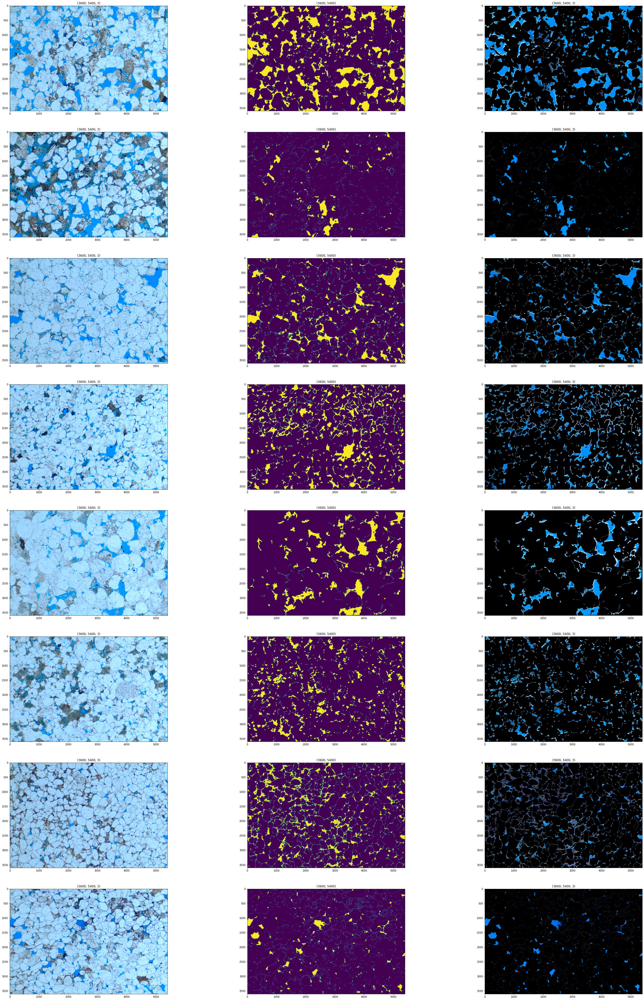

In [ ]:
voidImgs = vf.highlightVoidSpace(test_data[:,0],test_data[:,1],plot=True)

####Code to isolate voidspace with no output

In [ ]:
voidImgs = vf.highlightVoidSpace(test_data[:,0],test_data[:,1])#,plot=True)

<Figure size 3456x7200 with 0 Axes>

####Continue here

In [ ]:
print(voidImgs.shape)

void_r = voidImgs[:,:,:,0].ravel()
void_r = void_r[void_r>0]
void_g = voidImgs[:,:,:,1].ravel()
void_g = void_g[void_g>0]
void_b = voidImgs[:,:,:,2].ravel()
void_b = void_b[void_b>0]

vf.findVoidValues(void_r,void_g,void_b)
print()

(2, 3600, 5400, 3)
Format	[mean,stdev]
R	[101.49321864190789, 36.864617182333525]
G	[135.59643433044465, 44.090815370097204]
B	[198.4753805152502, 47.93745925682754]



###Show plots of rgb values and their distributions

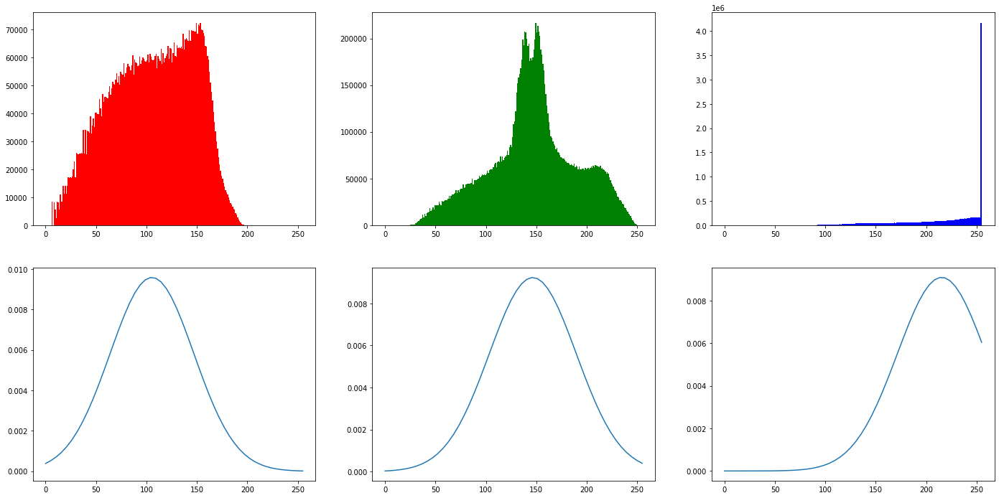

In [ ]:
from scipy import stats

fig = figure(0, (24,12))
x = np.linspace(0,255)

fig.add_subplot(2,3,1)
plt.hist(void_r, bins=255, range=(0,255),color="red")
fig.add_subplot(2,3,4)
plt.plot(x,stats.norm.pdf(x, vf.meanR, vf.stdevR))

fig.add_subplot(2,3,2)
plt.hist(void_g, bins=255, range=(0,255),color="green")
fig.add_subplot(2,3,5)
plt.plot(x,stats.norm.pdf(x, vf.meanG, vf.stdevG))

fig.add_subplot(2,3,3)
plt.hist(void_b, bins=255, range=(0,255),color="blue")
fig.add_subplot(2,3,6)
plt.plot(x,stats.norm.pdf(x, vf.meanB, vf.stdevB))

print()

###Find Best Standard Deviation

In [ ]:
fig = figure(0, (48,50))

imgs = test_data[0]
orig = imread(imgs[0])
# fig.add_subplot(5, 4, 1); title(orig.shape)
# imshow(orig)
clas = convert_to_bin(plt.imread(imgs[1],0),invert=True)

figNum = 1
for i in range(20,32,2):
  fig.add_subplot(6, 4, figNum); title(clas.shape)
  imshow(clas)
  predicted_img = vf.predictImg(orig,i/10,invert=True)
  fig.add_subplot(6, 4, figNum+1); title(f'{i/10} stdv away')
  imshow(predicted_img)
  figNum += 2
clas = None
orig = None
predicted_img = None

Output hidden; open in https://colab.research.google.com to view.

###See Predictions!

In [ ]:
fig = figure(0, (48,25))
figNum = 1

for xy in test_data:
  orig = imread(xy[0])
  fig.add_subplot(len(test_data),3, figNum); title("Input")
  imshow(orig)
  clas = convert_to_bin(plt.imread(xy[1],0),invert=True)
  fig.add_subplot(len(test_data), 3, figNum+1); title("Expected")
  imshow(clas)
  predicted_img = vf.predictImg(orig,2.4,invert=True)
  fig.add_subplot(len(test_data), 3, figNum+2); title("Predicted")
  imshow(predicted_img)
  figNum += 3
clas = None
orig = None
predicted_img = None

Output hidden; open in https://colab.research.google.com to view.

##Mean Standard & Deviation Approach
###Dependent rgb

The idea is to get the rgb values of known void space then find their means and standard deviations



If a given rgb pixel measure fits within a chosen range, it must be void space as well

In [ ]:
from scipy.stats import norm
from statistics import stdev

class VoidFinderManualDep(object):
    def __init__(self):
      pass

    def highlightVoidSpace(self, input, output,plot=False,update=False,resize=False):
      fig = figure(0, (48,100))
      num_cols = 3
      num_rows = int(ceil(len(input)*3/num_cols)) + 3
      cur_img = -2
      voidImgs = []
      for i in range(len(input)):
        cur_img += 3
        orig = plt.imread(input[i],0)
        clas = convert_to_bin(cv2.resize(plt.imread(output[i],0),(orig.shape[1],orig.shape[0])),invert=True)
        if resize:
          shp = orig.shape
          orig = cv2.resize(orig,(shp[1]//10,shp[0]//10))
          clas = cv2.resize(clas,(shp[1]//10,shp[0]//10))
        voidR = np.multiply(orig[:,:,0],clas).astype(int)
        voidG = np.multiply(orig[:,:,1],clas).astype(int)
        voidB = np.multiply(orig[:,:,2],clas).astype(int)
        void = np.dstack((voidR,voidG,voidB))
        voidImgs.append(void)
        if plot:
          fig.add_subplot(num_rows, num_cols, cur_img); title(orig.shape)
          imshow(orig)
          fig.add_subplot(num_rows, num_cols, cur_img+1); title(clas.shape)
          imshow(clas)
          fig.add_subplot(num_rows, num_cols, cur_img+2); title(void.shape)
          imshow(void)
      # voidImgs = [voidImgs[i,j,k] if not voidImgs[i,j,k] == [0,0,0] for i in range(len(voidImgs)) for j in range(len(voidImgs[i])) for k in range(len(voidImgs[i][j]))]
      orig = None
      clas = None
      void = None
      voidRGB = []
      if update:
        print('Found RGBs; Removing zeros...')
      for i in range(len(voidImgs)):
        if update and i%10000 == 0:
          print(f'{i}/{len(voidImgs)}')
        for j in range(len(voidImgs[i])):
          for k in range(len(voidImgs[i][j])):
            # print(voidImgs[i][j][k])
            if not (np.all(voidImgs[i][j][k][0]) == 0):
              voidRGB.append(voidImgs[i][j][k])
      voidImgs = None
      self.voidRGB = np.array(voidRGB)
      voidRGB = None
      return self.voidRGB

    # def reduceRGBs(self, amt=5):
    #   i = 0
    #   tot = self.voidRGB.shape[0]
    #   while i < tot:

    def isVoidSpace(self,x,amt=1):
      examples = [x]
      # for i in range(-1*amt,amt):
      #   for j in range(-1*amt,amt):
      #     for k in range(-1*amt,amt):
      #       xPrime = x
      #       xPrime[0] = x[0] + i
      #       xPrime[1] = x[1] + j
      #       xPrime[2] = x[2] + k
      #       examples.append(xPrime)
      for y in self.voidRGB:
        for z in examples:
          if np.array_equal(z,y):
            # print("found true")
            return True
      return False
      

      # for i in range(amt):
      #   for j in range(amt):
      #     for k in range(amt):
      #       xp = np.array(x); xp[0] = xp[0]+1*i; xp[1] = xp[1]+1*j; xp[2] = xp[2]+1*k
      #       xm = np.array(x); xm[0] = xm[0]-1*i; xm[1] = xm[1]-1*j; xm[2] = xm[2]-1*k

      #       found.append(any([np.array_equal(xp,y) for y in self.voidRGB]))
      #       found.append(any([np.array_equal(xm,y) for y in self.voidRGB]))
      # print(any(found))
      # return any(found)

    def predictImg(self, input, update=False,amt=0):
      shp = input.shape

      out_rvl = []

      if update:
        print('Making predictions by pixel...')
      for i in range(shp[0]):
        if update and i%10 == 0:
          print(f'row {i} of {shp[0]}')
        for j in range(shp[1]):
          if self.isVoidSpace(input[i,j,:],amt):
            out_rvl.append(1)
          else:
            out_rvl.append(0)
      
      out_im = np.reshape(np.array(out_rvl),(shp[0],shp[1]))
      return out_im


In [ ]:
vf = VoidFinderManualDep()

In [ ]:
#same highlightVoidSpace method as before, except removes instences of [0,0,0]
vf.highlightVoidSpace(test_data[:,0],test_data[:,1],resize=True)#,plot=True, update=True)
print(vf.voidRGB.shape)

(33354, 3)


<Figure size 3456x7200 with 0 Axes>

###Visualize dependent RGB values
Click and drag to move graph perspective

In [ ]:
voidStr = []
for i in range(vf.voidRGB.shape[0]):
  voidStr.append(f'{vf.voidRGB[i,0]},{vf.voidRGB[i,1]},{vf.voidRGB[i,2]}')
print(f'{len(Counter(voidStr).keys())} different rgb values') #number of the same rgb values
print(f'{vf.voidRGB.shape[0]} total') #number of void pixels in the image
voidStr = None

23762 different rgb values
28241 total


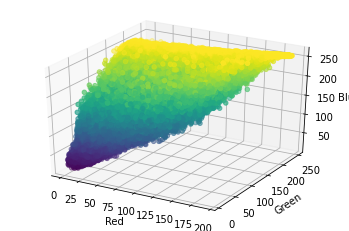

In [ ]:
xdata = vf.voidRGB[:,0]
ydata = vf.voidRGB[:,1]
zdata = vf.voidRGB[:,2]

ax = plt.axes(projection='3d')
ax.scatter3D(xdata, ydata, zdata, c=zdata);
ax.set_xlabel('Red')
ax.set_ylabel('Green')
ax.set_zlabel('Blue')
ax.mouse_init()#Not sure if mouse_init is working on some co labs
plt.show()
ax = None
xdata = None
ydata = None
zdata = None

###See Predictions!

In [ ]:
fig = figure(0, (48,50))

imgs = test_data[0]
orig = imread(imgs[0])
clas = convert_to_bin(plt.imread(imgs[1],0),invert=True)

orig = cv2.resize(orig,(orig.shape[1]//10,orig.shape[0]//10))
clas = cv2.resize(clas,(orig.shape[1],orig.shape[0]))
predicted_img = vf.predictImg(orig, update=True)

fig.add_subplot(1, 2, 1); title(clas.shape)
imshow(clas)
fig.add_subplot(1, 2, 2)
imshow(predicted_img)
clas = None
orig = None
predicted_img = None

Making predictions by pixel...
row 0 of 360
row 10 of 360
row 20 of 360
row 30 of 360
row 40 of 360
row 50 of 360
row 60 of 360
row 70 of 360
row 80 of 360
row 90 of 360
row 100 of 360
row 110 of 360
row 120 of 360
row 130 of 360
row 140 of 360
row 150 of 360
row 160 of 360
row 170 of 360
row 180 of 360
row 190 of 360
row 200 of 360
row 210 of 360
row 220 of 360
row 230 of 360
row 240 of 360
row 250 of 360
row 260 of 360
row 270 of 360
row 280 of 360
row 290 of 360
row 300 of 360


This Code took too long to run 

##CNN Approach

In [ ]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, InputLayer, Dropout, MaxPooling2D
from keras.losses import BinaryCrossentropy
from keras.metrics import MeanIoU
tf.config.run_functions_eagerly(True)




class ConvolutionNeuralNet(tf.keras.Model):
    def construct_CNN(self):
        #create model
        self.model = tf.keras.Sequential(
            [
                Conv2D(10, kernel_size=5, activation='relu', input_shape=(360, 540, 3)),
                MaxPooling2D(pool_size=(3,3)),
                Flatten(),
                Dense(100, activation='relu'),
                Dropout(.2),
                Dense(360*540, activation='sigmoid')
            ]
        )
    def __init__(self):
        super(ConvolutionNeuralNet, self).__init__()
        self.construct_CNN();
        Loss = BinaryCrossentropy()
        Metric = MeanIoU(num_classes=2)
        self.model.compile(optimizer='adam', loss=Loss, metrics=[Metric])
    def forward(self, x, predict=True):
        if predict:
            return tf.nn.sigmoid(self.model(x)*10)
        return self.model(x)
    def predict(self, x):
        y = self.forward(x, predict=True)
        return y.numpy() #tf.reshape(y, (-1, image_size, image_size)).numpy()


In [ ]:
# model = NeuralNet('CNN')
model = ConvolutionNeuralNet()
print(model.model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 356, 536, 10)      760       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 118, 178, 10)      0         
_________________________________________________________________
flatten (Flatten)            (None, 210040)            0         
_________________________________________________________________
dense (Dense)                (None, 100)               21004100  
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 194400)            19634400  
Total params: 40,639,260
Trainable params: 40,639,260
Non-trainable params: 0
____________________________________________

In [ ]:
inputs = []
outputs = []
shp = imread(train_data[0][0]).shape
print(shp)
for xy in train_data:
  inputs.append(cv2.resize(imread(xy[0]),(shp[1]//10,shp[0]//10)))
  outputs.append(convert_to_bin(cv2.resize(imread(xy[1],0),(shp[1]//10,shp[0]//10)),invert=True).ravel())
inputs = np.array(inputs)
outputs = np.array(outputs)
print(inputs.shape)
print(outputs.shape)

(3600, 5400, 3)
(6, 360, 540, 3)
(6, 194400)


In [ ]:
model.model.fit(inputs, outputs, epochs=500, verbose=2)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


Epoch 1/500
1/1 - 2s - loss: 0.2037 - mean_io_u: 0.8417
Epoch 2/500
1/1 - 1s - loss: 0.2978 - mean_io_u: 0.7512
Epoch 3/500
1/1 - 1s - loss: 0.2745 - mean_io_u: 0.6779
Epoch 4/500
1/1 - 1s - loss: 0.2393 - mean_io_u: 0.5723
Epoch 5/500
1/1 - 1s - loss: 0.8669 - mean_io_u: 0.7427
Epoch 6/500
1/1 - 1s - loss: 0.4627 - mean_io_u: 0.7631
Epoch 7/500
1/1 - 2s - loss: 0.1956 - mean_io_u: 0.8153
Epoch 8/500
1/1 - 2s - loss: 0.2900 - mean_io_u: 0.6136
Epoch 9/500
1/1 - 1s - loss: 0.2979 - mean_io_u: 0.7090
Epoch 10/500
1/1 - 2s - loss: 0.3822 - mean_io_u: 0.5585
Epoch 11/500
1/1 - 1s - loss: 0.2799 - mean_io_u: 0.6738
Epoch 12/500
1/1 - 1s - loss: 0.2715 - mean_io_u: 0.6386
Epoch 13/500
1/1 - 1s - loss: 0.1732 - mean_io_u: 0.6050
Epoch 14/500
1/1 - 1s - loss: 0.1619 - mean_io_u: 0.5341
Epoch 15/500
1/1 - 1s - loss: 0.2439 - mean_io_u: 0.4977
Epoch 16/500
1/1 - 1s - loss: 0.2689 - mean_io_u: 0.4436
Epoch 17/500
1/1 - 2s - loss: 0.2662 - mean_io_u: 0.4436
Epoch 18/500
1/1 - 2s - loss: 0.2730 - m

In [ ]:
test_in = []
test_out = []
count = 0
shp = imread(test_data[0][0]).shape
print(shp)
shp = (shp[1]//10,shp[0]//10)
for xy in test_data:
  test_in.append(cv2.resize(imread(xy[0]),shp))
  test_out.append(cv2.resize(convert_to_bin(imread(xy[1],0),invert=True),shp))
  count+=1
test_in = np.array(test_in)
test_out = np.array(test_out)
print(test_in.shape)
print(test_out.shape)

preds = model.predict(test_in)
fig = figure(0, (48,50))
nextFig = 1

for i in range(2):
  fig.add_subplot(2,3,nextFig)
  imshow(test_in[i])
  fig.add_subplot(2,3,nextFig+1)
  imshow(test_out[i])
  fig.add_subplot(2,3,nextFig+2)
  imshow(np.reshape(preds[i],(shp[1],shp[0])))
  nextFig += 3


Output hidden; open in https://colab.research.google.com to view.

##Semantic Segmentation Approach


In [ ]:
import os

from google.colab import drive
from pathlib import Path
drive.mount("/content/drive")

Mounted at /content/drive


I decided to re-organize the data to make loading it into data batches easier

In [ ]:
segmentation_dir = '/content/drive/My Drive/Segmentation Cracks'

In [ ]:
cd '$segmentation_dir'

/content/drive/My Drive/Segmentation Cracks


In [ ]:
!pip install wget #For colab
%pylab inline
from fastai.vision import *
from pathlib import Path
import pandas as pd
import json

  Created wheel for wget: filename=wget-3.2-cp37-none-any.whl size=9681 sha256=617cf9c8e3b026a0c52d20a9d9703155f599ceac921515262b44db3f6be14f3f
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget
Populating the interactive namespace from numpy and matplotlib


In [ ]:
path=Path()
path.ls()

[PosixPath('images'), PosixPath('masks')]

In [ ]:
fnames = get_image_files(path/'images')
fnames[:3]

[PosixPath('images/MGX_09_3.tif'),
 PosixPath('images/MGX_14_1.tif'),
 PosixPath('images/MGX_20_2.tif')]

In [ ]:
lbl_names = get_image_files(path/'masks')
lbl_names[:3]

[PosixPath('masks/MGX_09_3.png'),
 PosixPath('masks/MGX_14_1.png'),
 PosixPath('masks/MGX_20_2.png')]

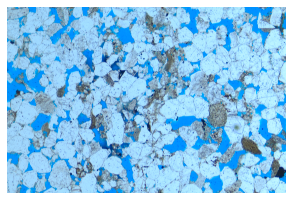

In [ ]:
img_f = fnames[0]
img = open_image(img_f)
img.show(figsize=(5,5))

Uses the file name to locate the corresponding mask (this is what caused me to create a seperate, re-organized data folder)

In [ ]:
def get_y_fn(x): return path/'masks'/(x.stem + '.png')
classes = array(['rock', 'fracture'])

In [ ]:
import cv2
#classified images in rgb
#   this funciton converts to grayscale, then splits to binary classes (0 & 1)
def convert_to_bin(img,threshold=127.5,invert=False):
  grayImage = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  (thresh, blackAndWhiteImage) = cv2.threshold(grayImage, 127, 255, cv2.THRESH_BINARY)
  grayImage = None
  if not invert:
    return blackAndWhiteImage/255
  else:
    return np.absolute((blackAndWhiteImage/255) - np.ones(blackAndWhiteImage.shape))

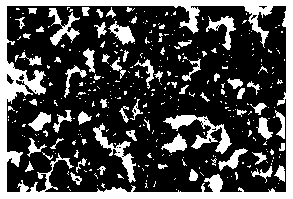

In [ ]:
mask = open_mask(get_y_fn(img_f), div=True) #div=True divides the pixel values by 255
mask.show(figsize=(5,5), alpha=1, cmap='binary')

In [ ]:
unique(mask.data)

array([0, 1])

In [ ]:
src = (SegmentationItemList.from_folder(path/'images')
       .split_by_rand_pct(0.2)
       .label_from_func(get_y_fn, classes=classes))

In [ ]:
data = (src.transform(get_transforms(), tfm_y=True, size=(256,256))
        .databunch(bs=4)
        .normalize(imagenet_stats))

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

In [ ]:
data

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

ImageDataBunch;

Train: LabelList (7 items)
x: SegmentationItemList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegmentationLabelList
ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256)
Path: images;

Valid: LabelList (1 items)
x: SegmentationItemList
Image (3, 256, 256)
y: SegmentationLabelList
ImageSegment (1, 256, 256)
Path: images;

Test: None

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

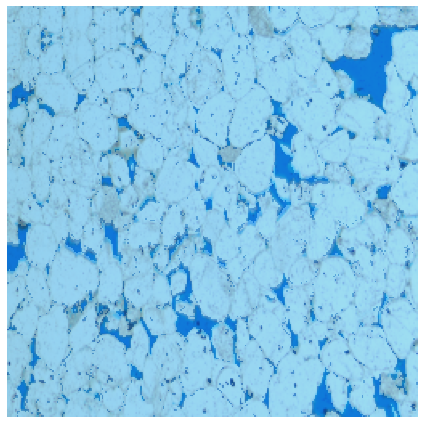

In [ ]:
data.show_batch(1, figsize=(6,6))

I believe the error lies somewhere in here, but I couldn't find a configuration to resolve it

In [ ]:
def conv_trans(ni, nf, ks = 4, stride = 2, padding = 1):
    return nn.Sequential(
        nn.ConvTranspose2d(ni, nf, kernel_size=ks, bias=False, stride=stride, padding = padding), 
        nn.ReLU(inplace = True), 
        nn.BatchNorm2d(nf))

In [ ]:
custom_head=nn.Sequential(conv_trans(512, 256), 
                          conv_trans(256, 128),
                          conv_trans(128, 64),
                          conv_trans(64, 32), 
                          nn.ConvTranspose2d(32, 4, kernel_size=4, bias=False, stride=2, padding = 1))

In [ ]:
def pixel_accuracy(yhat, y):
    y_=y.squeeze(dim=1)
    yhat_=yhat.argmax(dim=1)
    return (y_==yhat_).sum().float()/y.numel()

In [ ]:
learn=cnn_learner(data, models.resnet18, custom_head=custom_head, metrics=pixel_accuracy)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


This line throws an error, meaning the learner was not configured properly

In [ ]:
learn.lr_find() #IndexError: Target # is out of bounds.

epoch,train_loss,valid_loss,pixel_accuracy,time


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


IndexError: ignored

Because of this, the rest of the code fails and we abandoned this approach

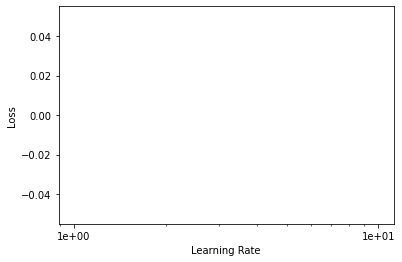

In [ ]:
learn.recorder.plot()

In [ ]:
lr=1e-4
learn.fit_one_cycle(4, slice(lr/10, lr))

epoch,train_loss,valid_loss,pixel_accuracy,time


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

IndexError: ignored

In [ ]:
learn.export('/content/drive/My Drive/Computer Vision/Segmentation Cracks/semantic-segmentation.pkl')

FileNotFoundError: ignored

In [ ]:
with torch.no_grad():
    x,y = next(iter(learn.data.valid_dl))
    yhat = to_np(learn.model(x))

yhat=yhat.argmax(1)

Given the road-blocks we have encountered and the other approaches already performing exceptionally, we have decided to abandon this approach. Semantic segmentation isn't entirely necessary for this type of project. Semantic segmentation is a process that can assign specific classes to each pixel of an image. Though this is a very attractive approach for a lot of areas of Computer Vision, this level of complexity is not required. The model is searching for and identifying fractures formations in rock, producing binary output. If we were looking for specific types of fractures, this method may prove more useful, but since we are only searching for fractures in general, there are other methods that are less complex to perform the task.

#Thoughts before moving forward to build the real model

###Mean/Standard Deviation with Independent RGB Values
RGB values are only somewhat independent

This approach makes two *possibly* large assumptions:
  - The resin useed for training is the same used for testing
  - The non-void area is not similar in color to othe resin useed

This approach does significantly better in prerdicting void space than the others, but relies heavily on the assumptions above

###Mean/Standerd Deviation with Dependent RGB Values
Data takes a long time to process as it is: 3200x5400 = 19,440,000. Predicting pixel by pixel isnt plausable.

Image size did not pose a large issue with indepentent rgb values, likely because values are much easier to check: 

 - R,G,or B value between respective mean+-amt*stdev
 - vs 
 - does [R,G,B] value exist within collection

Additionally, an [R,G,B] value of [5,10,20] is similar to [6,11,21], but even checking for 15 [R,G,B] values (all combinations within +-1 of a given value) within a collection of 1,000,000 values for 194,400 pixels (images scaled by 10%) is not a good solution

Scaling more loses even more information when scaled back up

###CNN
Sequental cannot be created in co lab at the given size of 3200x5400

After scaled by 10% (320x540), a cnn could be created

The IOU in these models is much lower than the independent RGB approach

###Semantic Segmentation
We were unable to successfully create a model for this approach

The complexity of semantic segmentation is more than is needed, and overall it doesn't seem to be a logical approach for this project

#Building Automatic Model
###With Independent RGB Values

In [ ]:
from scipy.stats import norm
from statistics import stdev
def computeIOU(y,yHat):
    overlap = y*yHat # Logical AND
    union = y + yHat # Logical OR
    IOU = overlap.sum()/float(union.sum())
    return IOU

class VoidFinderAutoInd(object):
    def __init__(self,validate=False):
      pass


    def train(self,input,output,plot=False,invert=True,update=True):
      if update:
        print('training..')
        print('\tisolating void space..')
      voidImgs = self.highlightVoidSpace(input,output,plot=plot,invert=invert)
      if update:
        print('\tvoid space isolated\n\tremoving zeros..')
      void_r = voidImgs[:,:,:,0].ravel()
      void_r = void_r[void_r>0]
      void_g = voidImgs[:,:,:,1].ravel()
      void_g = void_g[void_g>0]
      void_b = voidImgs[:,:,:,2].ravel()
      void_b = void_b[void_b>0]
      voidImgs = None
      if update:
        print('\tzeros removed\n\tgetting means and standard deviations..')
      self.findVoidValues(void_r,void_g,void_b,update=update)
      void_r = None
      void_g = None
      void_b = None
      if update:
        print("\tfound means and standard deviations\n\tgetting best range..")
        ranges = []
        best_range = 1
        self.iou = 0
      for j in range(20,30,2):
        self.range = j/10
        for xy in test_data:
          ious = []
          orig = imread(xy[0])
          predicted_img = self.predict(orig,update=False)
          shp = orig.shape
          orig = None
          clas = convert_to_bin(cv2.resize(plt.imread(xy[1],0),(shp[1],shp[0])),invert=True)
          ious.append(computeIOU(clas,predicted_img))
          clas = None
          predicted_img = None
        if mean(ious) > self.iou:
          best_range = j/10
          self.iou = mean(ious)
        else:
          print(f'\t{j/10} was over best range')
          self.range = (j-2)/10
          break
      if update:
        print(f"\tgot best range: {self.range}\ntraining complete!")
      return [[[self.meanR,self.stdevR],[self.meanG,self.stdevG],[self.meanB,self.stdevB]],self.range,self.iou]

    def validateTrain(self,input,output,plot=False,invert=True,update=True):
      self.models = []
      kFold = len(input)//2
      if update:
        print(f'training with {kFold}-fold validation..')
      for i in range(kFold):
        (train_data, valid_data) = test_train_split(input, output)
        if update:
          print(f'\tvalidation {i}')
          print(f'\t\ttraining   size: {len(train_data)}')
          print(f'\t\tvalidation size: {len(valid_data)}')
        self.train(train_data[:,0],train_data[:,1])
        if update:
          print(f"\t\tvalidating..")
        self.validate(valid_data,i)
      if update:
        print("validation complete!\ngetting best model..")
      highest_val_iou = 0
      highest_val_index = -1
      for i in range(len(self.models)):
        if self.models[i][3] > highest_val_iou:
          highest_val_index = i
      best_model = self.models[highest_val_index]
      mean_stdev = best_model[0]
      self.meanR = mean_stdev[0][0]
      self.stdevR = mean_stdev[0][1]
      self.meanG = mean_stdev[1][0]
      self.stdevG = mean_stdev[1][1]
      self.meanB = mean_stdev[2][0]
      self.stdevB = mean_stdev[2][1]
      self.range = best_model[1]
      self.iou = best_model[2]
      self.val_iou = best_model[3]
      if update:
        print(f"best model selected\n\trange:{self.range}\n\ttrainingIOU:{self.iou}\n\tvalidateIOU:{self.val_iou}")
      return

    def predict(self,input,invert=True,update=True):
      if update:
        print("predicting..")
      output = self.predictImg(input,invert=invert)
      if update:
        print("prediction complete!")
      return output

    def validate(self,valid_data,round,update=True):
      val_ious = []
      for xy in valid_data:
        orig = imread(xy[0])
        clas = convert_to_bin(cv2.resize(plt.imread(xy[1],0),(orig.shape[1],orig.shape[0])),invert=True)
        predicted_img = vf.predict(orig,update=False)
        val_ious.append(computeIOU(clas,predicted_img))
        clas = None
        orig = None
        predicted_img = None
      self.val_iou = mean(val_ious)
      if update:
        print(f"\tvalidation round {round} complete!\n\t\trange:{self.range}\n\t\ttrainingIOU:{self.iou}\n\t\tvalidateIOU:{self.val_iou}")
      self.models.append([[[self.meanR,self.stdevR],[self.meanG,self.stdevG],[self.meanB,self.stdevB]],self.range,self.iou,self.val_iou])



    def highlightVoidSpace(self, input, output,plot=False,invert=True):
      fig = figure(0, (48,100))
      num_cols = 3
      num_rows = int(ceil(len(input)*3/num_cols)) + 3
      cur_img = -2
      voidImgs = []
      for i in range(len(input)):
        cur_img += 3
        orig = plt.imread(input[i],0)
        clas = convert_to_bin(cv2.resize(plt.imread(output[i],0),(orig.shape[1],orig.shape[0])),invert=invert)
        voidR = np.multiply(orig[:,:,0],clas).astype(int)
        voidG = np.multiply(orig[:,:,1],clas).astype(int)
        voidB = np.multiply(orig[:,:,2],clas).astype(int)
        void = np.dstack((voidR,voidG,voidB))
        voidImgs.append(void)
        if plot:
          fig.add_subplot(num_rows, num_cols, cur_img); title(orig.shape)
          imshow(orig)
          fig.add_subplot(num_rows, num_cols, cur_img+1); title(clas.shape)
          imshow(clas)
          fig.add_subplot(num_rows, num_cols, cur_img+2); title(void.shape)
          imshow(void)
      orig = None
      clas = None
      void = None
      return np.array(voidImgs)

    def findVoidValues(self, voidR, voidG, voidB,update=True):
      self.stdevR = stdev(voidR)
      self.meanR = mean(voidR)
      self.stdevG = stdev(voidG)
      self.meanG = mean(voidG)
      self.stdevB = stdev(voidB)
      self.meanB = mean(voidB)
      # if update:
      #   print('Format\t[mean,stdev]')
      #   print(f'R\t{[self.meanR,self.stdevR]}\nG\t{[self.meanG,self.stdevG]}\nB\t{[self.meanB,self.stdevB]}')
      return ([self.meanR,self.stdevR], [self.meanG,self.stdevG], [self.meanB,self.stdevB])

    def withinRange(self,val,color='A'):
      stdev = None
      mean = None
      if color == 'R':
        stdev = self.stdevR
        mean = self.meanR
      elif color == 'G':
        stdev = self.stdevG
        mean = self.meanG
      elif color == 'B':
        stdev = self.stdevB
        mean = self.meanB
      else:
        stdev = mean([self.stdevR,self.stdevG,stdevB])
        mean = mean([self.meanR,self.meanG,self.meanB])
      return val <= mean + self.range*stdev and val >= mean - self.range*stdev

    def isVoidSpace(self, x):
      xR = x[0]
      xG = x[1]
      xB = x[2]
      return self.withinRange(xR,'R') and self.withinRange(xG,'G') and self.withinRange(xB,'B')

    def predictImg(self,input,invert=False):
      shp = input.shape

      out_rvl = []

      for i in range(shp[0]):
        for j in range(shp[1]):
          if self.isVoidSpace(input[i,j,:]):
            out_rvl.append(1)
          else:
            out_rvl.append(0)
      
      out_im = np.reshape(np.array(out_rvl),(shp[0],shp[1]))
      if invert:
        out_im = np.absolute(out_im - np.ones(out_im.shape))
      return out_im
      

In [ ]:
vf = VoidFinderAutoInd()
vf.train(train_data[:,0],train_data[:,1])

fig = figure(0, (24,10))
figNum = 1

for xy in test_data:
  orig = imread(xy[0])
  fig.add_subplot(len(test_data),3, figNum); title("Input")
  imshow(orig)
  clas = convert_to_bin(cv2.resize(plt.imread(xy[1],0),(orig.shape[1],orig.shape[0])),invert=True)
  fig.add_subplot(len(test_data), 3, figNum+1); title("Expected")
  imshow(clas)
  predicted_img = vf.predict(orig)
  fig.add_subplot(len(test_data), 3, figNum+2); title(f"Predicted - IOU:{computeIOU(clas,predicted_img)}")
  imshow(predicted_img)
  figNum += 3
print("waiting for images")
clas = None
orig = None
predicted_img = None

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
vf = VoidFinderAutoInd()
vf.validateTrain(train_data[:,0],train_data[:,1])

fig = figure(0, (24,10))
figNum = 1

for xy in test_data:
  orig = imread(xy[0])
  fig.add_subplot(len(test_data),3, figNum); title("Input")
  imshow(orig)
  clas = convert_to_bin(cv2.resize(plt.imread(xy[1],0),(orig.shape[1],orig.shape[0])),invert=True)
  fig.add_subplot(len(test_data), 3, figNum+1); title("Expected")
  imshow(clas)
  predicted_img = vf.predict(orig)
  fig.add_subplot(len(test_data), 3, figNum+2); title(f"Predicted - IOU:{computeIOU(clas,predicted_img)}")
  imshow(predicted_img)
  figNum += 3
print("waiting for images")
clas = None
orig = None
predicted_img = None

Output hidden; open in https://colab.research.google.com to view.